
**Introduction**

This project explores the Airbnb market in Tokyo, focusing on identifying key trends and patterns that impact both visitors and hosts.

By analyzing a rich dataset that includes calendar and listing information, the project aims to uncover insights regarding the busiest times of the year and to predict pricing trends. I utilized various data columns; however, in the future (closer to my trip to Tokyo), I plan to exclude columns that are not predictive, such as the number of listings per host. Additionally, I intend to improve the handling of latitude and longitude data by categorizing them into distance-based batches relative to the city center.

# Importing libraries, fonts, loading datasets and retrieving information about them

## Imports and installations

In [492]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json
import statsmodels.formula.api as smf
import matplotlib.font_manager as font_manager
import statsmodels.api as sm
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, train_test_split
%pip install wordcloud
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap
sns.set()
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
import xgboost as xgb

In [493]:
# Install and set up font for charts
!wget -q https://github.com/google/fonts/raw/main/ofl/lato/Lato-Regular.ttf
font_manager.fontManager.addfont('Lato-Regular.ttf')
plt.rcParams['font.family'] = 'Lato'

In [494]:
# Import datasets
calendar_df = pd.read_csv('https://data.insideairbnb.com/japan/kant%C5%8D/tokyo/2024-06-29/data/calendar.csv.gz')
df = pd.read_csv('https://data.insideairbnb.com/japan/kant%C5%8D/tokyo/2024-03-30/data/listings.csv.gz')

## Calendar_df discovery analysis

In [495]:
# Calendar_df discovery
pd.set_option('display.max_columns', None)
calendar_df

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,197677,2024-06-30,f,"$12,000.00",NaN,3.0,1125.0
1,197677,2024-07-01,f,"$12,000.00",NaN,3.0,1125.0
2,197677,2024-07-02,t,"$12,000.00",NaN,3.0,1125.0
3,197677,2024-07-03,t,"$12,000.00",NaN,3.0,1125.0
4,197677,2024-07-04,t,"$12,000.00",NaN,3.0,1125.0
...,...,...,...,...,...,...,...
6023521,1189054292409642178,2025-06-24,f,"$38,000.00",NaN,1.0,6.0
6023522,1189054292409642178,2025-06-25,f,"$38,000.00",NaN,1.0,6.0
6023523,1189054292409642178,2025-06-26,f,"$38,000.00",NaN,1.0,6.0
6023524,1189054292409642178,2025-06-27,f,"$38,000.00",NaN,1.0,6.0


In [496]:
# Calc the percentage of missing data in each column
calendar_missing_data_percentage = calendar_df.isna().sum().sort_values(ascending=False) / len(calendar_df.isna()) * 100
calendar_missing_data_percentage

,0
adjusted_price,100.000000
minimum_nights,0.000017
maximum_nights,0.000017
listing_id,0.000000
date,0.000000
available,0.000000
price,0.000000


In [497]:
# Get info about the dataset
calendar_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6023526 entries, 0 to 6023525
Data columns (total 7 columns):
 #   Column          Dtype  
---  ------          -----  
 0   listing_id      int64  
 1   date            object 
 2   available       object 
 3   price           object 
 4   adjusted_price  float64
 5   minimum_nights  float64
 6   maximum_nights  float64
dtypes: float64(3), int64(1), object(3)
memory usage: 321.7+ MB


## DF discovery analysis

In [498]:
df.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,890199509573985394,https://www.airbnb.com/rooms/890199509573985394,20240330234233,2024-03-31,previous scrape,东京练马喜美民宿101,You'll have a great time at this comfortable p...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,513564293,https://www.airbnb.com/users/show/513564293,旭昭,2023-05-07,"Tokyo, Japan",NaN,within a few hours,100%,94%,f,https://a0.muscache.com/im/pictures/user/User-...,https://a0.muscache.com/im/pictures/user/User-...,NaN,5,15,"['email', 'phone']",t,t,NaN,Nerima Ku,NaN,35.742539,139.632561,Private room in home,Private room,2,NaN,1 bath,NaN,NaN,"[""Washer"", ""Smoke alarm"", ""Air conditioning"", ...",NaN,1,365,1.0,1.0,365.0,365.0,1.0,365.0,NaN,t,0,0,0,0,2024-03-31,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,M130020725,f,5,2,3,0,NaN
1,31868772,https://www.airbnb.com/rooms/31868772,20240330234233,2024-03-31,city scrape,"B26_JR Yamanote Line walk 1 mins, Nishinippori",We have Free wifi/washing machine/refrigerator...,NaN,https://a0.muscache.com/pictures/c25ac4d0-baab...,158518748,https://www.airbnb.com/users/show/158518748,Yang,2017-11-13,"Chuo City, Japan",No replying after 10pm or before 10 am *(Tokyo...,within an hour,100%,100%,f,https://a0.muscache.com/im/pictures/user/e5612...,https://a0.muscache.com/im/pictures/user/e5612...,Arakawa District,9,15,"['email', 'phone']",t,t,NaN,Arakawa Ku,NaN,35.733870,139.767850,Entire rental unit,Entire home/apt,4,1.5,1.5 baths,1.0,2.0,"[""Stove"", ""Rice maker"", ""Private entrance"", ""R...","$14,457.00",2,1125,2.0,2.0,1125.0,1125.0,2.0,1125.0,NaN,t,2,19,49,50,2024-03-31,100,37,3,2019-02-17,2024-03-14,4.63,4.82,4.81,4.84,4.76,4.68,4.62,Hotels and Inns Business Act | 东京都荒川区 | 31 荒保衛...,t,9,9,0,0,1.60
2,24378724,https://www.airbnb.com/rooms/24378724,20240330234233,2024-03-31,city scrape,Ririleo Koenji Room 103. 2 stations from Shinjuku,****Room No. 103****<br />If you will stayed w...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,23956957,https://www.airbnb.com/users/show/23956957,Kana,2014-11-20,"Nakano, Japan",Hello! Thank you for visiting my page. I'm Kan...,within an hour,100%,88%,t,https://a0.muscache.com/im/pictures/user/fcce4...,https://a0.muscache.com/im/pictures/user/fcce4...,Suginami District,3,12,"['email', 'phone']",t,t,NaN,Suginami Ku,NaN,35.701970,139.646170,Entire rental unit,Entire home/apt,6,1.0,1 bath,1.0,5.0,"[""AC - split type ductless system"", ""Children\...","$36,143.00",1,365,1.0,2.0,90.0,365.0,1.7,179.1,NaN,t,4,15,34,128,2024-03-31,127,22,0,2018-05-05,2024-01-28,4.83,4.77,4.77,4.95,4.93,4.84,4.72,M130000221,f,3,3,0,0,1.77
3,1060499710482458044,https://www.airbnb.com/rooms/1060499710482458044,20240330234233,2024-03-31,city scrape,【錦糸町駅徒歩6分！】

In [499]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14802 entries, 0 to 14801
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            14802 non-null  int64  
 1   listing_url                                   14802 non-null  object 
 2   scrape_id                                     14802 non-null  int64  
 3   last_scraped                                  14802 non-null  object 
 4   source                                        14802 non-null  object 
 5   name                                          14802 non-null  object 
 6   description                                   14588 non-null  object 
 7   neighborhood_overview                         9648 non-null   object 
 8   picture_url                                   14802 non-null  object 
 9   host_id                                       14802 non-null 

In [500]:
# Calc the percentage of missing data in each column
df_isna = df.isna().sum() > 0
missing_data_percentage = df.loc[:, df_isna].isna().sum().sort_values(ascending=False) / len(df) * 100
columns_with_missing_data_above_10 = missing_data_percentage[missing_data_percentage > 10.3]
columns_with_missing_data_above_10

,0
calendar_updated,100.000000
neighbourhood_group_cleansed,100.000000
host_neighbourhood,59.390623
neighbourhood,34.819619
neighborhood_overview,34.819619
host_about,31.387650
host_location,30.894474
review_scores_value,10.512093
review_scores_location,10.505337
review_scores_communication,10.505337


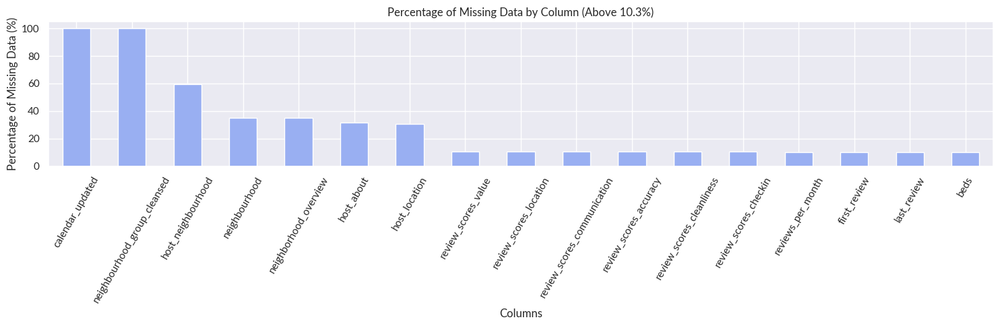

In [501]:
# Visualization of missing data in df
plt.figure(figsize=(15, 5))
columns_with_missing_data_above_10.plot(kind='bar', color='#99AFF2')
plt.title('Percentage of Missing Data by Column (Above 10.3%)')
plt.xlabel('Columns')
plt.ylabel('Percentage of Missing Data (%)')
plt.xticks(rotation=60)
plt.tight_layout()
plt.show()

# First dataset cleanup and analysis

In [502]:
# Data cleanup
calendar_df['date'] = pd.to_datetime(calendar_df['date'])
calendar_df['adjusted_price'] = calendar_df['price'].replace('[$,]', '', regex=True).astype('float')
calendar_df = calendar_df.drop(columns='price')
calendar_df_cleaned = calendar_df.dropna()
calendar_df_cleaned['occupied'] = np.where(calendar_df_cleaned['available'] == 'f', 1, 0)

<ipython-input-502-2278a4399062>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  calendar_df_cleaned['occupied'] = np.where(calendar_df_cleaned['available'] == 'f', 1, 0)


In [503]:
# Prep calendar_df for visualisation

# Agregation
calendar_df_occupied_grouped = calendar_df_cleaned.groupby(['listing_id', 'date']).agg(
    occupied_days=('occupied', 'sum'),
    total_days=('date', 'count'),
    total_earnings=('adjusted_price', 'sum')
).reset_index()

# Extract month from date
calendar_df_occupied_grouped['month'] = calendar_df_occupied_grouped['date'].dt.month

# Group by month (without year)
calendar_df_occupied_grouped_by_month = calendar_df_occupied_grouped.groupby('month').agg(
    occupied_days=('occupied_days', 'sum'),
    total_days=('total_days', 'sum'),
    total_earnings=('total_earnings', 'sum')
).reset_index()

# Calc avg price per night and occupation rate
calendar_df_occupied_grouped_by_month['avg_price_per_night'] = (
    calendar_df_occupied_grouped_by_month['total_earnings'] /
    calendar_df_occupied_grouped_by_month['occupied_days']
)

calendar_df_occupied_grouped_by_month['occupation_rate'] = (
    calendar_df_occupied_grouped_by_month['occupied_days'] /
    calendar_df_occupied_grouped_by_month['total_days']
)

# Sort by month
calendar_df_occupied_grouped_by_month.sort_values('month', inplace=True)

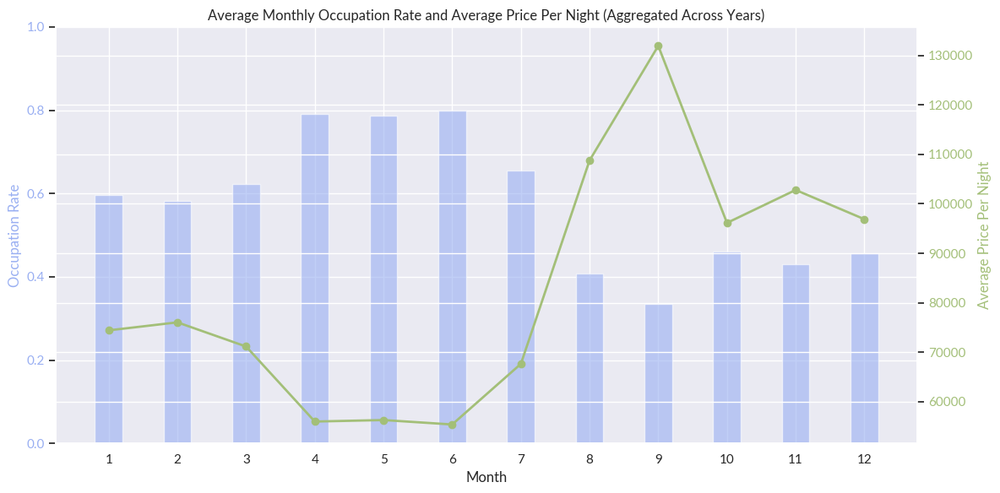

In [504]:
# Calendar df visualisation
fig, ax1 = plt.subplots(figsize=(12, 6))

# Bar plot for occupation rate
ax1.bar(calendar_df_occupied_grouped_by_month['month'],
        calendar_df_occupied_grouped_by_month['occupation_rate'],
        color='#99AFF2',
        label='Occupation Rate',
        width=0.4,
        alpha=0.6)

# Customization of the first axis
ax1.set_xlabel('Month')
ax1.set_ylabel('Occupation Rate', color='#99AFF2')
ax1.tick_params(axis='y', labelcolor='#99AFF2')
ax1.set_ylim(0, 1.0)
ax1.set_xticks(calendar_df_occupied_grouped_by_month['month'])
ax1.set_xticklabels(calendar_df_occupied_grouped_by_month['month'], rotation=0)
ax2 = ax1.twinx()

# Add line plot for average price per night
ax2.plot(calendar_df_occupied_grouped_by_month['month'],
         calendar_df_occupied_grouped_by_month['avg_price_per_night'],
         color='#A3BF78',
         label='Average Price Per Night',
         linewidth=2,
         marker='o')

# Customization of the second axis
ax2.set_ylabel('Average Price Per Night', color='#A3BF78')
ax2.tick_params(axis='y', labelcolor='#A3BF78')

# Title and legend
plt.title('Average Monthly Occupation Rate and Average Price Per Night (Aggregated Across Years)')
fig.tight_layout()
plt.show()

I will be interested in traveling in April or May. June is in the rainy season, so in my further analysis and I can clearly see that flights are currently cheaper in may.

In [505]:
# Data aggregation
calendar_df_occupied_grouped_by_month_and_id = calendar_df_occupied_grouped.groupby(['listing_id', 'month']).agg(
    occupied_days=('occupied_days', 'sum'),
    total_days=('total_days', 'sum'),
).reset_index()

calendar_df_occupied_grouped_by_month_and_id = calendar_df_occupied_grouped_by_month_and_id[calendar_df_occupied_grouped_by_month_and_id['month'] == 5]

# Calc occupation rate
calendar_df_occupied_grouped_by_month_and_id['occupation_rate'] = (
    calendar_df_occupied_grouped_by_month_and_id['occupied_days'] /
    calendar_df_occupied_grouped_by_month_and_id['total_days']
)

calendar_df_occupied_grouped_by_month_and_id.reset_index(inplace=True)
calendar_df_occupied_grouped_by_month_and_id

,index,listing_id,month,occupied_days,total_days,occupation_rate
0,4,197677,5,5,31,0.16129
1,16,776070,5,31,31,1.00000
2,28,905944,5,31,31,1.00000
3,40,1016831,5,31,31,1.00000
4,52,1196177,5,31,31,1.00000
...,...,...,...,...,...,...
16499,197992,1188807027935790805,5,31,31,1.00000
16500,198004,1188807658642978418,5,31,31,1.00000
16501,198016,1188862130812517749,5,31,31,1.00000
16502,198028,1189007613727558111,5,31,31,1.00000


# Second dataset cleanup and feature engineering

In [506]:
# Delete columns with links, they are definitely not needed in further analysis
df.drop(columns=['listing_url', 'picture_url', 'host_url', 'host_thumbnail_url', 'host_picture_url'], inplace=True)

In [507]:
# Check if 'id' is unique and can be used as an index
df['id'].unique().size == len(df)

True

In [508]:
# Set id as an index
df.set_index('id', inplace=True)

In [509]:
df.shape

(14802, 69)

In [510]:
# Remove columns with siginificant missing data percentage. I don't want to lose important data such as price so I set the limit at 10.3%
columns_to_drop = missing_data_percentage[missing_data_percentage > 10.3].index
df_cleaned = df.drop(columns=columns_to_drop)

In [511]:
# Check if other columns can be useful
df_cleaned['scrape_id'].unique()
df_cleaned.drop(columns='scrape_id', inplace=True)

In [512]:
# Transformation of the boolean data
for col in ['host_is_superhost', 'host_has_profile_pic', 'host_identity_verified', 'has_availability', 'instant_bookable']:
  df_cleaned[col] = df_cleaned[col].map({'t': True, 'f': False}).fillna(False)

<ipython-input-512-272e747c66a6>:3: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_cleaned[col] = df_cleaned[col].map({'t': True, 'f': False}).fillna(False)
<ipython-input-512-272e747c66a6>:3: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_cleaned[col] = df_cleaned[col].map({'t': True, 'f': False}).fillna(False)


In [513]:
# Transformation of the price column
# Replace dollars and commas with an empty string which will be exported to float
df_cleaned['price'] = df_cleaned['price'].str.replace('[$,]', '', regex=True).astype('float')

In [514]:
# Transformation of the rating columns
df_cleaned['host_response_rate'] = df_cleaned['host_response_rate'].str.replace('%', '', regex=False).astype('float') / 100.0
df_cleaned['host_acceptance_rate'] = df_cleaned['host_acceptance_rate'].str.replace('%', '', regex=False).astype('float') / 100.0

In [515]:
# Transformation of the categorial columns
df_cleaned['room_type'].unique()
df_cleaned['neighbourhood_cleansed'].unique()
df_cleaned['host_response_time'].unique()
df_cleaned[['host_response_time', 'room_type', 'neighbourhood_cleansed']] = df_cleaned[['host_response_time', 'room_type', 'neighbourhood_cleansed']].apply(lambda x: x.astype('category'))

In [516]:
# Converting string into python list
df_cleaned['host_verifications'] = df['host_verifications'].apply(eval)

In [517]:
# Converting json formatted string into python dictionary
df_cleaned['amenities'] = df_cleaned['amenities'].apply(json.loads)

In [518]:
# Bathroom data cleanup
df_cleaned['bathrooms_text'].unique()
df_cleaned['bathrooms_text'].str.contains('half', case=False, na=False).unique()
np.where(df_cleaned['bathrooms_text'].str.contains('half', case=False, na=False), 0.5, df['bathrooms_text'].str.split().str[0]).astype('float')
df_cleaned['bathrooms_calculated'] = \
np.where(df_cleaned['bathrooms_text'].str.contains('half', case=False, na=False), 0.5, df_cleaned['bathrooms_text'].str.split().str[0]).astype('float')

In [519]:
df_cleaned['license'].unique()

array(['M130020725',
       'Hotels and Inns Business Act | 东京都荒川区 | 31 荒保衛環き（三）第1号',
       'M130000221', ..., 'M130032529', 'M130038658',
       'Hotels and Inns Business Act | 千代田区千代田保健所 | 30千千保生環き第79号'],
      dtype=object)

In [520]:
df_cleaned['host_since'] = pd.to_datetime(df_cleaned['host_since'], errors='coerce')
reference_date = pd.Timestamp("2024-04-30")
df_cleaned['days_since_host'] = (reference_date - df_cleaned['host_since']).dt.days
bins = [-np.inf, 365, 730, 1095, np.inf]
labels = ['3', '2', '1', '0']
df_cleaned['host_group'] = pd.cut(df_cleaned['days_since_host'], bins=bins, labels=labels)

In [521]:
# Drop columns that don't give me important data
df_cleaned.drop(columns=['name', 'host_verifications','last_scraped', 'source', 'host_name', 'calendar_last_scraped', 'description', 'license', 'bathrooms_text', 'bathrooms','host_since','property_type','amenities'], inplace=True)

In [522]:
# Drop rows with missing data
df_2 = df_cleaned.dropna()

# Visualisations

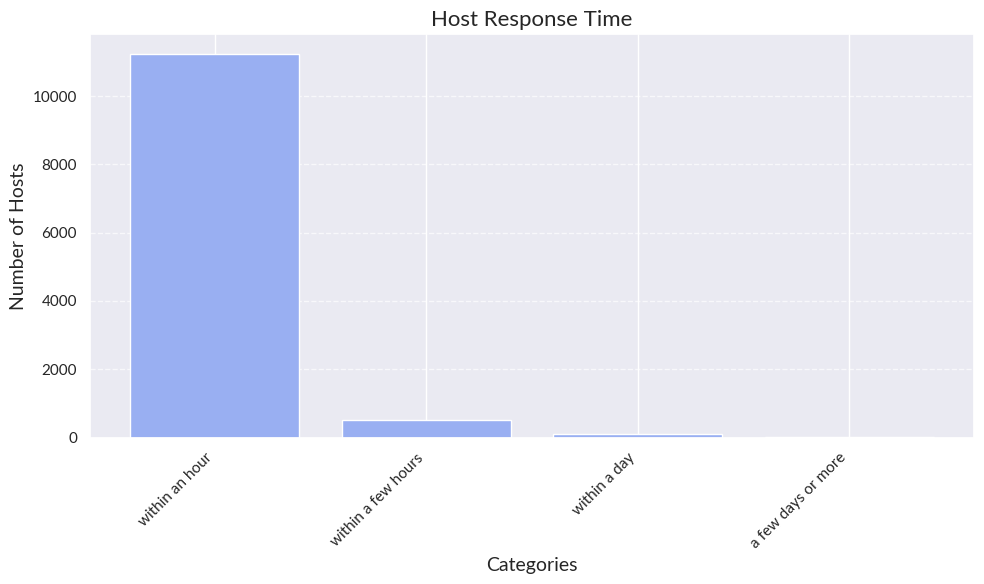

In [523]:
# Host response time visualization
categories = df_2['host_response_time'].value_counts().index
values = df_2['host_response_time'].value_counts().values
plt.figure(figsize=(10, 6))

plt.bar(categories, values, color='#99AFF2')
plt.title('Host Response Time', fontsize=16)
plt.xlabel('Categories', fontsize=14)
plt.ylabel('Number of Hosts', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [524]:
# Tokyo heatmap (price)
df_filtered = df_2.copy()

# Normalize the prices to use them as weights
max_price = df_filtered['price'].max()
df_filtered['price_normalized'] = df_filtered['price'] / max_price

# Create a base map centered around the median latitude and longitude
m = folium.Map(location=[df_filtered['latitude'].median(), df_filtered['longitude'].median()], zoom_start=10)

# Prep heatmap data (list of lat, lon and weight)
heat_data = [[row['latitude'], row['longitude'], row['price_normalized']] for index, row in df_filtered.iterrows()]

# Create the HeatMap
HeatMap(heat_data).add_to(m)

# Save the map to an HTML file
m.save('heatmap.html')

# Display the map
m

In [525]:
# Color map for room types

room_type_colors = {
    'Entire home/apt': '#99AFF2',
    'Private room': '#737373',
    'Shared room': '#A3BF78',
    'Hotel room': '#404040'
}

# Create a base map
m = folium.Map(location=[df_2['latitude'].median(), df_2['longitude'].median()], zoom_start=12)

# Add markers for each property based on room_type
for _, row in df_2.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=6,
        color=room_type_colors.get(row['room_type'], 'gray'),
        fill=True,
        fill_color=room_type_colors.get(row['room_type'], 'gray'),
        fill_opacity=0.7,
        popup=row['room_type']
    ).add_to(m)

# Save the map to an HTML file
m.save('room_type_map.html')

# Display the map
m

# Machine Learing Models

In [526]:
# Create new dataframe
data_tokyo_model = df_2.copy()

# Info about DF
data_tokyo_model.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11876 entries, 31868772 to 974867725759338265
Data columns (total 41 columns):
 #   Column                                        Non-Null Count  Dtype   
---  ------                                        --------------  -----   
 0   host_id                                       11876 non-null  int64   
 1   host_response_time                            11876 non-null  category
 2   host_response_rate                            11876 non-null  float64 
 3   host_acceptance_rate                          11876 non-null  float64 
 4   host_is_superhost                             11876 non-null  bool    
 5   host_listings_count                           11876 non-null  int64   
 6   host_total_listings_count                     11876 non-null  int64   
 7   host_has_profile_pic                          11876 non-null  bool    
 8   host_identity_verified                        11876 non-null  bool    
 9   neighbourhood_cleansed             

In [527]:
# Standarization and scaling of the data

# Define function for ordinal encoding, converting boolean to integers, and scaling
def EncodeAndScale(data_tokyo_model):
    # Use factorize (ordinal encoding) for categorical columns
    for column in data_tokyo_model.columns[data_tokyo_model.columns.isin(['neighbourhood_cleansed','room_type','host_response_time','host_group'])]:
        data_tokyo_model[column] = data_tokyo_model[column].factorize()[0]

    # Convert boolean columns to integers (1 -> True, 0 -> False)
    for column in data_tokyo_model.columns[data_tokyo_model.dtypes == 'bool']:
        data_tokyo_model[column] = data_tokyo_model[column].astype(int)

    # Scale numeric columns using StandardScaler
    scaler = StandardScaler()
    numeric_columns = data_tokyo_model.select_dtypes(include=['int64', 'float64']).columns
    data_tokyo_model[numeric_columns] = scaler.fit_transform(data_tokyo_model[numeric_columns])

    return data_tokyo_model

# Apply the function
data_tokyo_model_encoded_scaled = EncodeAndScale(data_tokyo_model.copy())

In [528]:
# Check of the data conversion results
data_tokyo_model_encoded_scaled.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11876 entries, 31868772 to 974867725759338265
Data columns (total 41 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   host_id                                       11876 non-null  float64
 1   host_response_time                            11876 non-null  float64
 2   host_response_rate                            11876 non-null  float64
 3   host_acceptance_rate                          11876 non-null  float64
 4   host_is_superhost                             11876 non-null  float64
 5   host_listings_count                           11876 non-null  float64
 6   host_total_listings_count                     11876 non-null  float64
 7   host_has_profile_pic                          11876 non-null  float64
 8   host_identity_verified                        11876 non-null  float64
 9   neighbourhood_cleansed                        

In [529]:
# Define x (predictors) and y (target - price)
x = data_tokyo_model_encoded_scaled.drop(columns=['price'])
y = data_tokyo_model_encoded_scaled['price']

# Split the data into training and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=60)

In [530]:
# Decision Tree Regression

# Define the parameter grid with correct max_features values
grid = {
    'min_samples_leaf': [0.01, 0.05, 0.1],
    'max_depth': [5, 10, 15],
    'max_features': ['sqrt', 'log2', None]
}

# Start the Decision Tree Regressor
decision_tree_model = DecisionTreeRegressor(random_state=105)

# Perform Grid Search with Cross-Validation to find the best parameters
grid_cv = GridSearchCV(decision_tree_model, grid, cv=5, scoring='r2', error_score='raise')
grid_cv.fit(x_train, y_train)

# Get the best model from grid search
optimal_decision_tree = grid_cv.best_estimator_

# Make predictions on the test data using the best model
predictions = optimal_decision_tree.predict(x_test)

# Evaluate the model performance using R-squared
r_squared = r2_score(y_test, predictions)

# Print the best parameters and the R-squared score
print(f'Best parameters: {grid_cv.best_params_}')
print(f'R-squared score: {r_squared:.4f}')

Best parameters: {'max_depth': 15, 'max_features': None, 'min_samples_leaf': 0.01}
R-squared score: 0.4114


In [531]:
# XGB

# Initialize the XGBoost regressor
xgb_reg = xgb.XGBRegressor(
    n_estimators=50,  # Number of trees
    learning_rate=0.16,  # Learning rate
    max_depth=5,       # Maximum depth of a tree
    random_state=42
)

# Fit the model
xgb_reg.fit(x_train, y_train)

# Make predictions
y_pred = xgb_reg.predict(x_test)

# Evaluate the model using R-squared
r_squared = r2_score(y_test, y_pred)
print(f"R-squared score: {r_squared:.4f}")

R-squared score: 0.5236
